In [1]:
#model_checkpoint = "t5-base"
# model_checkpoint = "unicamp-dl/ptt5-base-t5-vocab"
model_checkpoint = 'QA-ptt5-base-news-k10/checkpoint-9000'
#model_checkpoint = "facebook/bart-base"
#model_checkpoint = "unicamp-dl/ptt5-base-t5-vocab"
#model_checkpoint = 'neuralmind/bert-base-portuguese-cased'

In [2]:
K_Retrieval = 10
max_input_length = 1024
max_target_length = 32
test_path = "finetune_qa_pairs_14k_news/test_doc.pickle"

In [3]:
import pickle
    
with open(test_path, 'rb') as f:
    test_docs = pickle.load(f)

08/30/2021 10:54:43 - INFO - faiss.loader -   Loading faiss with AVX2 support.
08/30/2021 10:54:43 - INFO - faiss.loader -   Loading faiss.
08/30/2021 10:54:43 - INFO - farm.modeling.prediction_head -   Better speed can be achieved with apex installed from https://www.github.com/nvidia/apex .


In [4]:
test_docs

[{'question': ['Quantas das florestas da Amazônia são ameaçadas pela mudança climática'],
  'answer': ['85%'],
  'documents': [{'text': 'é aqui que o bicho pega. Essas espécies mais jovens, que já estão num ambiente naturalmente mais vulnerável, também são as mais ameaçadas pelo desmatamento —que predomina naquela região da Amazônia— e pela mudança climática, que está ressecando com mais intensidade o sudeste amazônico. Seria uma lástima se a ação humana transformasse o Gênesis em Apocalipse.', 'score': 22.42724, 'probability': 0.9428595467771259, 'question': None, 'meta': {'title': 'Área com espécies mais jovens de aves da Amazônia também é a mais frágil e ameaçada', '_split_id': 5}, 'embedding': None, 'id': '324411695322aaf8cc27ad1a4001d865'},
   {'text': 'Fundo Amazônia, para o Brasil de acordo com a redução das taxas de desmatamento]. Justin Adams Diretor executivo da TFA 2020 (aliança pelas florestas tropicais). Anteriormente, era diretor do setor de terras da ONG internacional Th

In [5]:
import pandas as pd
import ast

def preprocess(docs):
    questions = []
    answer = []
    docsReturn = []
    for instance in docs:
        question = "question: " + instance["question"][0]
        documents = ""
        doc = []
        for i in range (K_Retrieval):
            if i < len(instance["documents"]):
                document_dict = ast.literal_eval(str(instance["documents"][i]))
                document = document_dict["meta"]["title"] + " " + document_dict["text"]
                doc.append(document_dict["text"])
                question += "  context: "+document
        questions.append(question)
        answer.append(instance["answer"][0])
        docsReturn.append(doc)

    pd_dataset = pd.DataFrame({'question': questions, 'answer' : answer})
    pd_dataset.head()
    
    return(pd_dataset,docsReturn)


pd_dataset_test, docs = preprocess(test_docs)


In [6]:
from datasets import load_dataset, load_metric, DatasetDict, Dataset


dataset_test = Dataset.from_pandas(df=pd_dataset_test)


raw_datasets = DatasetDict({
    'test': dataset_test})
metric = load_metric("rouge")



In [7]:
from transformers import AutoTokenizer, T5Tokenizer, T5TokenizerFast, TFT5Model, TFT5ForConditionalGeneration

#tokenizer = AutoTokenizer.from_pretrained(model_checkpoint)
tokenizer = T5Tokenizer.from_pretrained(model_checkpoint)



In [8]:


def preprocess_input(examples):
    model_inputs = tokenizer(examples["question"], max_length=max_input_length, truncation=True)
    return model_inputs

def preprocess_function(examples):
    model_inputs = preprocess_input(examples)
    # Setup the tokenizer for targets
    labels = tokenizer(examples["answer"], max_length=max_target_length, truncation=True)

    model_inputs["labels"] = labels["input_ids"]
    return model_inputs

In [9]:
tokenized_datasets = raw_datasets.map(preprocess_function, batched=True)


  0%|          | 0/3 [00:00<?, ?ba/s]

In [10]:
from transformers import AutoModelForSeq2SeqLM, DataCollatorForSeq2Seq, Seq2SeqTrainingArguments, Seq2SeqTrainer

model = AutoModelForSeq2SeqLM.from_pretrained(model_checkpoint)

In [11]:
batch_size = 4
args = Seq2SeqTrainingArguments(
    "test-model",
    evaluation_strategy = "epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    weight_decay=0.01,
    save_total_limit=3,
    num_train_epochs=30,
    predict_with_generate=True,
    fp16=True,
    gradient_accumulation_steps = 4
)

In [12]:
data_collator = DataCollatorForSeq2Seq(tokenizer, model=model)

In [13]:
import nltk
#nltk.download('punkt')
import numpy as np

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    decoded_preds = tokenizer.batch_decode(predictions, skip_special_tokens=True)
    # Replace -100 in the labels as we can't decode them.
    labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)
    
    # Rouge expects a newline after each sentence
    decoded_preds = ["\n".join(nltk.sent_tokenize(pred.strip())) for pred in decoded_preds]
    decoded_labels = ["\n".join(nltk.sent_tokenize(label.strip())) for label in decoded_labels]
    
    result = metric.compute(predictions=decoded_preds, references=decoded_labels, use_stemmer=True)
    # Extract a few results
    result = {key: value.mid.fmeasure * 100 for key, value in result.items()}
    
    # Add mean generated length
    prediction_lens = [np.count_nonzero(pred != tokenizer.pad_token_id) for pred in predictions]
    result["gen_len"] = np.mean(prediction_lens)
    
    return {k: round(v, 4) for k, v in result.items()}

In [14]:
trainer = Seq2SeqTrainer(
    model,
    args,
    data_collator=data_collator,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics
)

In [15]:
a = trainer.predict(tokenized_datasets['test'], max_length=max_target_length)

/home/blab-answerer/anaconda3/lib/python3.8/site-packages/torch/nn/parallel/_functions.py:65: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn('Was asked to gather along dimension 0, but all '


08/30/2021 10:58:21 - INFO - /home/blab-answerer/anaconda3/lib/python3.8/site-packages/datasets/metric.py -   Removing /home/blab-answerer/.cache/huggingface/metrics/rouge/default/default_experiment-1-0.arrow


In [16]:
test_outputs = []
test_labels = []
for i in range(len(a.predictions)):
    test_outputs.append(tokenizer.decode(a.predictions[i], skip_special_tokens=True))
    test_labels.append(raw_datasets['test'][i]['answer'])
pd_output = pd.DataFrame({'predicted' : test_outputs, 'label' : test_labels})

In [17]:
from rouge_score import rouge_scorer
from nltk.tokenize import word_tokenize
from nltk.translate.bleu_score import SmoothingFunction
from nltk.metrics import f_measure
import nltk
import string
import re
import collections

def get_tokens(sentence):
    tokens = word_tokenize(sentence)
    return tokens

def normalize_text(sentence):

    def white_space_fix(text):
        return " ".join(text.split())

    def remove_punc(text):
        exclude = set(string.punctuation)
        return "".join(ch for ch in text if ch not in exclude)

    def lower(text):
        return text.lower()
    return white_space_fix(remove_punc(lower(sentence)))

def f1_score_qa(text_true,text_pred):
    "squad"
    text_true = normalize_text(text_true)
    text_pred = normalize_text(text_pred)
    true_tokens = get_tokens(text_true)
    pred_tokens = get_tokens(text_pred)
    common = collections.Counter(true_tokens) & collections.Counter(pred_tokens)
    num_same = sum(common.values())
    if len(true_tokens) == 0 or len(pred_tokens) == 0:
        return int(true_tokens==pred_tokens),int(true_tokens==pred_tokens),int(true_tokens==pred_tokens)
    if num_same == 0:
        return 0,0,0
    precision = 1 * num_same / len(pred_tokens)
    recall = 1 * num_same / len(true_tokens)
    f1 = (2 * precision * recall) / (precision + recall)
    return f1, precision, recall

def em_qa(text_true,text_pred):
    return int(normalize_text(text_true) == normalize_text(text_pred))

def rouge_l_qa(text_true,text_pred):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
    scores = scorer.score(text_true,text_pred)

    return scores["rougeL"].fmeasure

def em_qa_overall(text_true,text_pred):
    scores = 0
    for i in range(len(text_true)):
        scores += em_qa(text_true[i],text_pred[i])
    score = scores/len(text_true)
    return score

def f1_score_qa_overall(text_true,text_pred):
    f = 0
    for i in range(len(text_true)):
        fi,pi,ri = f1_score_qa(text_true[i],text_pred[i])
        f+=fi
    f = f/len(text_true)
    return f

def rouge_l_qa_overall(text_true,text_pred):
    scores = 0
    for i in range(len(text_true)):
        score = rouge_l_qa(text_true[i],text_pred[i])
        scores += score
    scores = scores/len(text_true)
    return scores

def scores(func,text_true,text_pred):
    if func=='rouge_l_qa':
        score_value = rouge_l_qa(text_true,text_pred)
    if func=='em_qa':
        score_value = em_qa(text_true,text_pred)
    if func=='f1_score_qa':
        score_value = f1_score_qa(text_true,text_pred)
    return (func, score_value)
        

def overall(func,text_true,text_pred):
    if func=='rouge_l_qa_overall':
        score_value = rouge_l_qa_overall(text_true,text_pred)
    if func=='em_qa_overall':
        score_value = em_qa_overall(text_true,text_pred)
    if func=='f1_score_qa_overall':
        score_value = f1_score_qa_overall(text_true,text_pred)
    return (func, score_value)

In [18]:
print("f1-score: " + str(overall("f1_score_qa_overall", test_labels, test_outputs)))
print("EM: " + str(overall('em_qa_overall', test_labels, test_outputs)))
print("Rouge-L: " + str(overall('rouge_l_qa_overall', test_labels, test_outputs)))

f1-score: ('f1_score_qa_overall', 0.3221177232525075)
EM: ('em_qa_overall', 0.2491894395553497)
Rouge-L: ('rouge_l_qa_overall', 0.32687013979278934)


In [19]:
questions = [q['question'][0] for q in test_docs]
questions[0:3]

['Quantas das florestas da Amazônia são ameaçadas pela mudança climática',
 'onde vive o gato pigmeu na América do Sul',
 'Quantas espécies de aves vivem em Cocha Cashu, Amazônia']

In [20]:
df = pd.DataFrame({'question':questions, 'answer': test_labels, 'gen_answer': test_outputs, "documents": docs})
print(len(df))
df.head()

2159


,question,answer,gen_answer,documents
0,Quantas das florestas da Amazônia são ameaçadas pela mudança climática,85%,Mais de 90%,"[é aqui que o bicho pega. Essas espécies mais jovens, que já estão num ambie..."
1,onde vive o gato pigmeu na América do Sul,Bacia do Rio da Madeira no Brasil,Florestas do Brasil,"[Na contramão do mundo, América do Sul vive há meses disparada de casos de C..."
2,"Quantas espécies de aves vivem em Cocha Cashu, Amazônia",58.,mais de 400.,"[Espécies ameaçadas No ofício, o Chico Mendes alerta que, nessas unidades, v..."
3,Qual é o pássaro mais comum encontrado em Monte Brasil?,Falcão,O bendito,[SOROCABA - Um pequeno pássaro que só habita duas regiões do Estado de São P...
4,Qual é o pássaro mais comum em Monte Brasil?,Falcão,O ribeirinho,"[Os kakapos foram os pássaros mais comum da Nova Zelândia, até serem pratica..."


# Test

In [21]:
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=1.0)

In [22]:
model_name = model_checkpoint
for _, row in tqdm(df.iterrows()):
    # F1-score
    _, f1_score = scores('f1_score_qa', row['gen_answer'], row['answer'])
    df.loc[df['question']==row['question'], '{}_f1'.format(model_name)] = round(f1_score[0], 2)

    # Rouge
    _, rouge_l = scores('rouge_l_qa', row['gen_answer'], row['answer'])
    rouge_l_f = rouge_l
    df.loc[df['question']==row['question'], '{}_rouge_l_f'.format(model_name)] = round(rouge_l_f, 2)

    # Exact Match
    _, em = scores('em_qa', row['gen_answer'], row['answer'])
    df.loc[df['question']==row['question'], '{}_em'.format(model_name)] = round(em, 2)
    
filename = 'TEST_RESULTS_{}_{}.csv'.format(model_name.split('/')[0], model_name.split('/')[1])
df.to_csv(filename, index=False)

2159it [00:03, 711.93it/s]


In [23]:
df.head()

,question,answer,gen_answer,documents,QA-ptt5-base-news-k10/checkpoint-9000_f1,QA-ptt5-base-news-k10/checkpoint-9000_rouge_l_f,QA-ptt5-base-news-k10/checkpoint-9000_em
0,Quantas das florestas da Amazônia são ameaçadas pela mudança climática,85%,Mais de 90%,"[é aqui que o bicho pega. Essas espécies mais jovens, que já estão num ambie...",0.0,0.0,0.0
1,onde vive o gato pigmeu na América do Sul,Bacia do Rio da Madeira no Brasil,Florestas do Brasil,"[Na contramão do mundo, América do Sul vive há meses disparada de casos de C...",0.4,0.4,0.0
2,"Quantas espécies de aves vivem em Cocha Cashu, Amazônia",58.,mais de 400.,"[Espécies ameaçadas No ofício, o Chico Mendes alerta que, nessas unidades, v...",0.0,0.0,0.0
3,Qual é o pássaro mais comum encontrado em Monte Brasil?,Falcão,O bendito,[SOROCABA - Um pequeno pássaro que só habita duas regiões do Estado de São P...,0.0,0.5,0.0
4,Qual é o pássaro mais comum em Monte Brasil?,Falcão,O ribeirinho,"[Os kakapos foram os pássaros mais comum da Nova Zelândia, até serem pratica...",0.0,0.5,0.0


In [24]:
sns.set(font_scale=1.0)

In [25]:
df.describe()

,QA-ptt5-base-news-k10/checkpoint-9000_f1,QA-ptt5-base-news-k10/checkpoint-9000_rouge_l_f,QA-ptt5-base-news-k10/checkpoint-9000_em
count,2159.000000,2159.000000,2159.000000
mean,0.322121,0.326929,0.249189
std,0.428221,0.427285,0.432644
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,0.860000,0.875000,0.000000
max,1.000000,1.000000,1.000000


08/30/2021 10:58:40 - INFO - numexpr.utils -   Note: NumExpr detected 32 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
08/30/2021 10:58:40 - INFO - numexpr.utils -   NumExpr defaulting to 8 threads.


<Figure size 7200x2160 with 0 Axes>

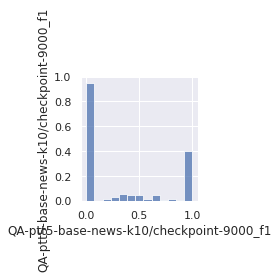

<Figure size 7200x2160 with 0 Axes>

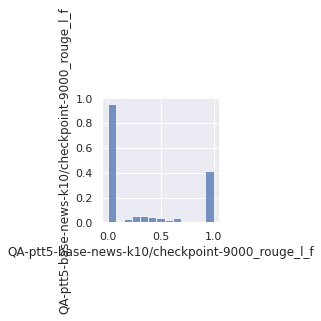

<Figure size 7200x2160 with 0 Axes>

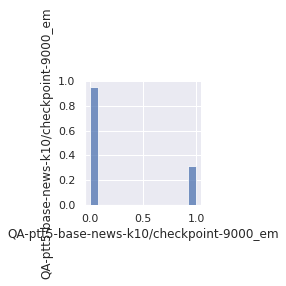

In [26]:
metrics = ['f1', 'rouge', 'em']
for metric in metrics:    
    plt.figure(figsize=(100, 30))

    sns.pairplot(df.filter(like=metric), diag_kind='hist', height=2.5)
    plt.show()